<a href="https://colab.research.google.com/github/Andresssg/Tesis/blob/main/Counting/counting_tracker.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install ultralytics
!pip install supervision
!pip install moviepy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import cv2
from ultralytics import YOLO
import supervision as sv


In [ ]:
video_name = 'video5.mp4'
#Copiar files
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Dataset/metrics/100epoch_clean/detect/train/weights/best.pt' /content
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/'{video_name} /content

In [ ]:
video_path = f"/content/{video_name}"
model_path = "/content/best.pt"
video_path_out = f"/content/out_{video_name}"
print(video_path)
print(model_path)
print(video_path_out)

/content/video5.mp4
/content/best.pt
/content/out_video5.mp4


In [ ]:
#Cargar modelo 
#model = YOLO(model_path)
model = YOLO("yolov8n.pt")
#results = model.track(source=video_path, tracker="botsort.yaml", save=True, conf=0.5)

100%|██████████| 6.23M/6.23M [00:00<00:00, 68.1MB/s]


In [ ]:
!pip install pafy
!pip install --upgrade youtube-dl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import pafy

cap = cv2.VideoCapture(video_path)
#url="https://www.youtube.com/watch?v=dQw4w9WgXcQ"

#video = pafy.new("https://www.youtube.com/watch?v=dQw4w9WgXcQ")

# Obtener el mejor flujo de video disponible
#best = video.getbest(preftype="mp4")
#cap = cv2.VideoCapture(best.url)


ret, frame = cap.read()
H, W, _ = frame.shape

#os.remove("video_out.mp4")


out = cv2.VideoWriter(video_path_out, cv2.VideoWriter_fourcc(*'MP4V'), int(cap.get(cv2.CAP_PROP_FPS)), (W, H))


In [ ]:

#Se definen los estilos de la caja
box_annotator = sv.BoxAnnotator(
    thickness=2,
    text_thickness=1,
    text_scale=0.5
)

#Se definen los puntos donde ve va a ubicar la linea
START = sv.Point(0, H/2)
END = sv.Point(W, H/2)

#Se definen los estilos de la linea y se colocan los puntos inicial y final
line_zone = sv.LineZone(start=START, end=END)

line_zone_annotator = sv.LineZoneAnnotator(
    thickness=2,
    text_thickness=1,
    text_scale=0.5,
)

frame_count = 0

#Se itera cada frame del video
for result in model.track(source=video_path, stream=True, verbose=True, save=True):

    if frame_count == 0:
      print('-----------', result)
      frame_count+=1
    
    #Se optiene el frame
    frame = result.orig_img
    #Se optienen las coordenadas y toda la informacion asociada a la deteccion
    detections = sv.Detections.from_yolov8(result)
    
    if result.boxes.id is not None:
        detections.tracker_id = result.boxes.id.cpu().numpy().astype(int)

    detections = detections[detections.class_id == 0]
    
    labels = [
        f"{tracker_id} {model.model.names[class_id]} {confidence:0.2f}"
        for _, confidence, class_id, tracker_id
        in detections
    ]

    frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
    
    line_zone.trigger(detections=detections)
    line_zone_annotator.annotate(frame=frame, line_counter=line_zone)

    out.write(frame)

    #frame_count += 1
    #if frame_count >= 50:
        #break
        

print(line_zone.in_count)
print(line_zone.out_count)

out.release()
cap.release()



video 1/1 (1/8625) /content/video5.mp4: 384x640 3 persons, 1 car, 130.5ms
video 1/1 (2/8625) /content/video5.mp4: 384x640 3 persons, 1 car, 10.2ms


----------- ultralytics.yolo.engine.results.Results object with attributes:

_keys: ('boxes', 'masks', 'probs', 'keypoints')
boxes: ultralytics.yolo.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog

Se han truncado las últimas 5000 líneas del flujo de salida.
video 1/1 (3628/8625) /content/video5.mp4: 384x640 3 persons, 1 car, 8.0ms
video 1/1 (3629/8625) /content/video5.mp4: 384x640 3 persons, 1 car, 13.2ms
video 1/1 (3630/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 14.7ms
video 1/1 (3631/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 10.1ms
video 1/1 (3632/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 10.3ms
video 1/1 (3633/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 7.5ms
video 1/1 (3634/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 10.2ms
video 1/1 (3635/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 7.3ms
video 1/1 (3636/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 7.8ms
video 1/1 (3637/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 7.8ms
video 1/1 (3638/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 9.4ms
video 1/1 (3639/8625) /content/video5.mp4: 384x640 4 persons, 1 car, 7.0ms
video 1/1 (3640/8625) /content/vid

4
1


In [ ]:
from IPython.display import HTML

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % video_path_out)

MoviePy - Building file /content/video.gif with imageio.


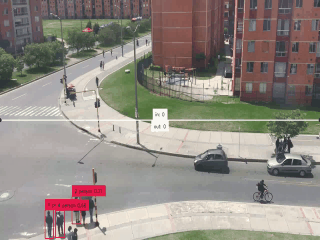

In [ ]:
from moviepy.editor import *

# Cargar el archivo de video MP4

video = VideoFileClip(video_path_out)

# Obtener la duración del video y establecer la duración del GIF
duration = video.duration
gif_duration = min(10, duration) # Duración del GIF: 10 segundos o la duración del video si es menor a 10 segundos

# Crear el archivo de animación GIF
gif_path = "/content/video.gif"
video.subclip(0, gif_duration).resize((320, 240)).write_gif(gif_path, fps=15)

# Mostrar el archivo de animación GIF en el cuaderno
from IPython.display import Image
Image(open(gif_path, 'rb').read())

In [ ]:
#Enviar a drive
!cp {video_path_out} '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/'
!cp '/content/runs/detect/track2/'{video_name} '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/out2_'{video_name}

In [ ]:
import shutil

#shutil.rmtree('/content/runs')